In [2]:
import pandas as pd 
import numpy as np
#from sklearn.datasets import load_boston
import matplotlib.pyplot as plt
import seaborn as sns



In [3]:
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler 

In [4]:
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

In [5]:
from sklearn.model_selection import train_test_split,GridSearchCV

In [6]:

#boston = load_boston()
#df = pd.DataFrame(boston.data, columns=boston.feature_names)
df = pd.read_csv('boston.csv')
#df['MEDV'] = boston.target

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
        - B        1000(Bk - 0.63)^2 where Bk is the proportion of black people by town
        - LSTAT    % lower status of the population

In [7]:
#print(load_boston()['DESCR'])

In [8]:
df

,Unnamed: 0,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0,0.000000,0.18,0.067815,0.314815,0.577505,0.641607,0.269203,0.000000,0.208015,0.287234,1.000000,0.089680,0.422222
1,1,0.000236,0.00,0.242302,0.172840,0.547998,0.782698,0.348962,0.043478,0.104962,0.553191,1.000000,0.204470,0.368889
2,2,0.000236,0.00,0.242302,0.172840,0.694386,0.599382,0.348962,0.043478,0.104962,0.553191,0.989737,0.063466,0.660000
3,3,0.000293,0.00,0.063050,0.150206,0.658555,0.441813,0.448545,0.086957,0.066794,0.648936,0.994276,0.033389,0.631111
4,4,0.000705,0.00,0.063050,0.150206,0.687105,0.528321,0.448545,0.086957,0.066794,0.648936,1.000000,0.099338,0.693333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,501,0.000633,0.00,0.420455,0.386831,0.580954,0.681771,0.122671,0.000000,0.164122,0.893617,0.987619,0.219095,0.386667
502,502,0.000438,0.00,0.420455,0.386831,0.490324,0.760041,0.105293,0.000000,0.164122,0.893617,1.000000,0.202815,0.346667
503,503,0.000612,0.00,0.420455,0.386831,0.654340,0.907312,0.094381,0.000000,0.164122,0.893617,1.000000,0.107892,0.420000
504,504,0.001161,0.00,0.420455,0.386831,0.619467,0.889804,0.114514,0.000000,0.164122,0.893617,0.991301,0.131071,0.377778


# EDA and Visualisation

In [9]:
df.describe()

,Unnamed: 0,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,252.500000,0.040544,0.113636,0.391378,0.349167,0.521869,0.676364,0.242381,0.371713,0.422208,0.622929,0.898568,0.301409,0.389618
std,146.213884,0.096679,0.233225,0.251479,0.238431,0.134627,0.289896,0.191482,0.378576,0.321636,0.230313,0.230205,0.197049,0.204380
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,126.250000,0.000851,0.000000,0.173387,0.131687,0.445392,0.433831,0.088259,0.130435,0.175573,0.510638,0.945730,0.144040,0.267222
50%,252.500000,0.002812,0.000000,0.338343,0.314815,0.507281,0.768280,0.188949,0.173913,0.272901,0.686170,0.986232,0.265728,0.360000
75%,378.750000,0.041258,0.125000,0.646628,0.491770,0.586798,0.938980,0.369088,1.000000,0.914122,0.808511,0.998298,0.420116,0.444444
max,505.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
df.dtypes

Unnamed: 0      int64
CRIM          float64
ZN            float64
INDUS         float64
NOX           float64
RM            float64
AGE           float64
DIS           float64
RAD           float64
TAX           float64
PTRATIO       float64
B             float64
LSTAT         float64
MEDV          float64
dtype: object

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  506 non-null    int64  
 1   CRIM        506 non-null    float64
 2   ZN          506 non-null    float64
 3   INDUS       506 non-null    float64
 4   NOX         506 non-null    float64
 5   RM          506 non-null    float64
 6   AGE         506 non-null    float64
 7   DIS         506 non-null    float64
 8   RAD         506 non-null    float64
 9   TAX         506 non-null    float64
 10  PTRATIO     506 non-null    float64
 11  B           506 non-null    float64
 12  LSTAT       506 non-null    float64
 13  MEDV        506 non-null    float64
dtypes: float64(13), int64(1)
memory usage: 55.5 KB


In [12]:
df.memory_usage()

Index          128
Unnamed: 0    4048
CRIM          4048
ZN            4048
INDUS         4048
NOX           4048
RM            4048
AGE           4048
DIS           4048
RAD           4048
TAX           4048
PTRATIO       4048
B             4048
LSTAT         4048
MEDV          4048
dtype: int64

In [13]:
df.isnull().sum()

Unnamed: 0    0
CRIM          0
ZN            0
INDUS         0
NOX           0
RM            0
AGE           0
DIS           0
RAD           0
TAX           0
PTRATIO       0
B             0
LSTAT         0
MEDV          0
dtype: int64

array([[<AxesSubplot: title={'center': 'Unnamed: 0'}>,
        <AxesSubplot: title={'center': 'CRIM'}>,
        <AxesSubplot: title={'center': 'ZN'}>,
        <AxesSubplot: title={'center': 'INDUS'}>],
       [<AxesSubplot: title={'center': 'NOX'}>,
        <AxesSubplot: title={'center': 'RM'}>,
        <AxesSubplot: title={'center': 'AGE'}>,
        <AxesSubplot: title={'center': 'DIS'}>],
       [<AxesSubplot: title={'center': 'RAD'}>,
        <AxesSubplot: title={'center': 'TAX'}>,
        <AxesSubplot: title={'center': 'PTRATIO'}>,
        <AxesSubplot: title={'center': 'B'}>],
       [<AxesSubplot: title={'center': 'LSTAT'}>,
        <AxesSubplot: title={'center': 'MEDV'}>, <AxesSubplot: >,
        <AxesSubplot: >]], dtype=object)

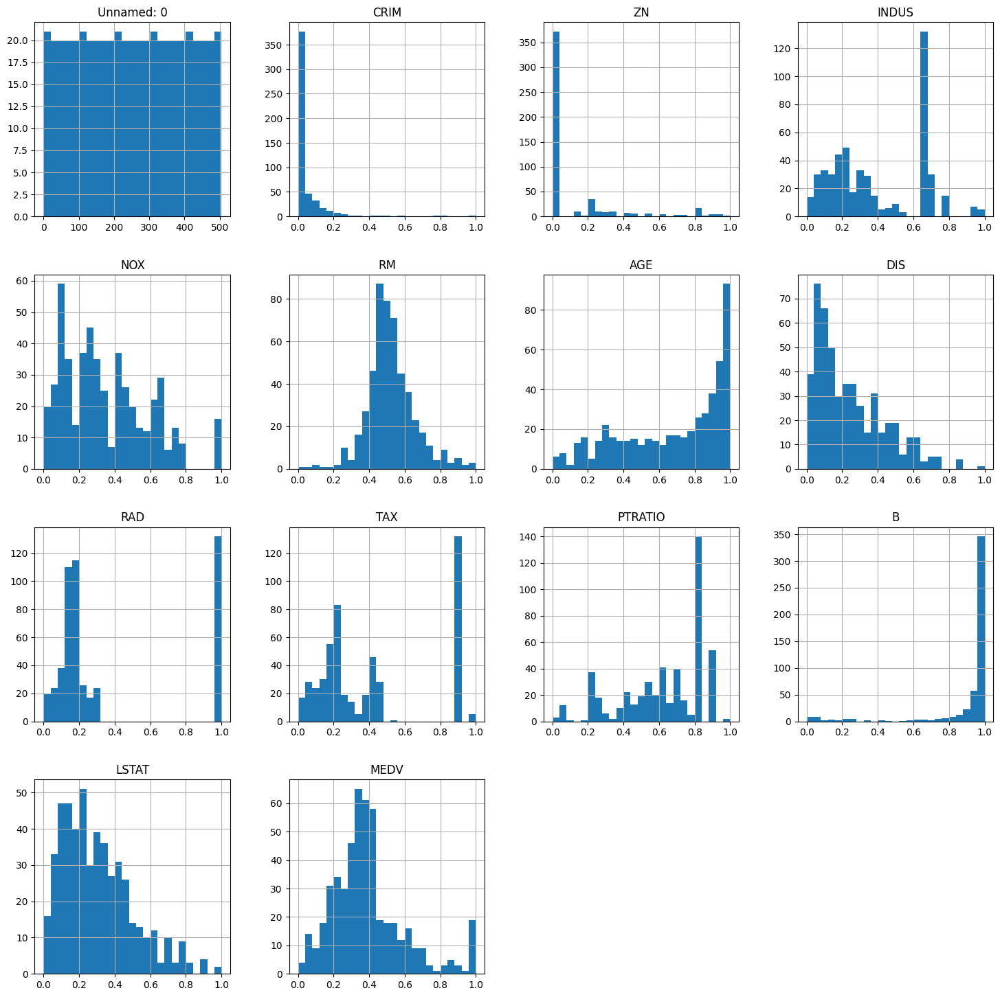

In [14]:
df.hist(figsize=(18,18), bins=25)

C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:1826: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=self.x, y=self.y, **kwargs)
C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:1826: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=self.x, y=self.y, **kwargs)
C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:1826: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=self.x, y=self.y, **kwargs)
C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\seaborn\axisgrid.py:1826: FutureWarning: 

`shade` is now deprecated in favor of `fill`; settin

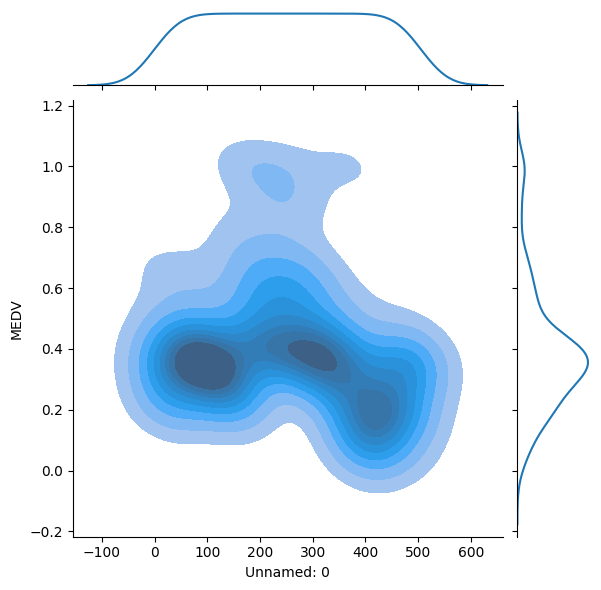

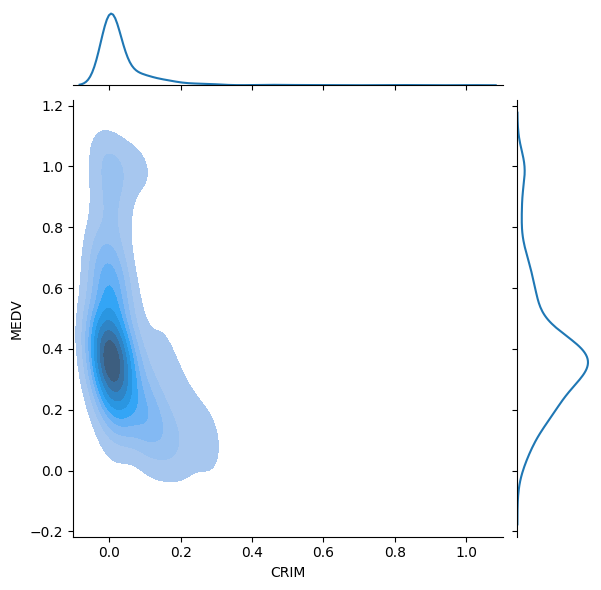

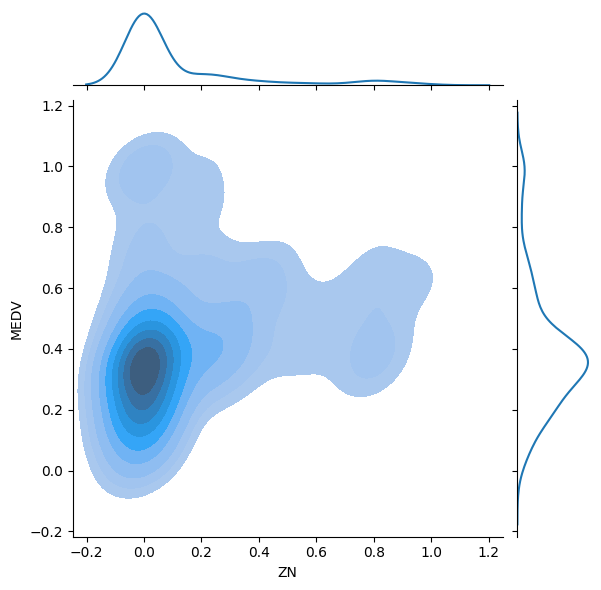

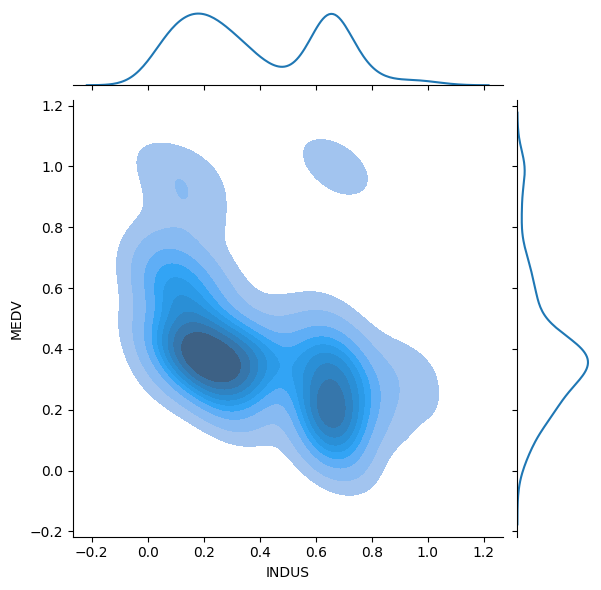

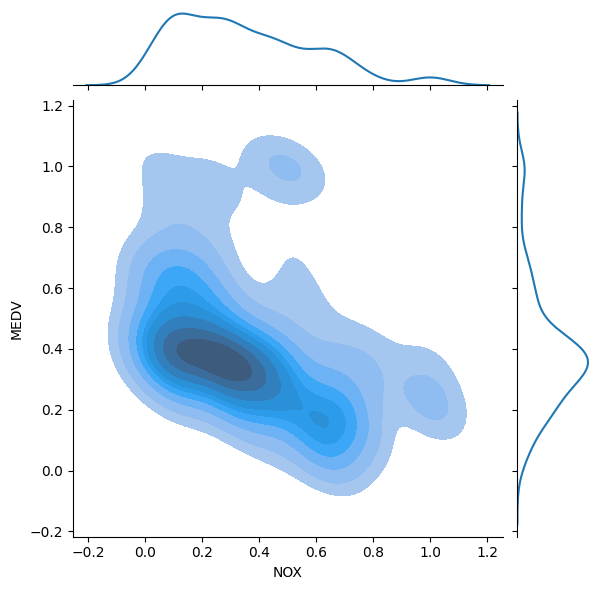

...

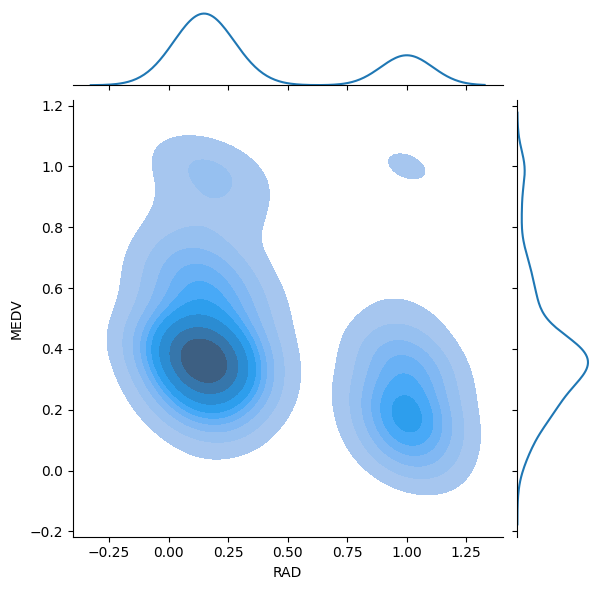

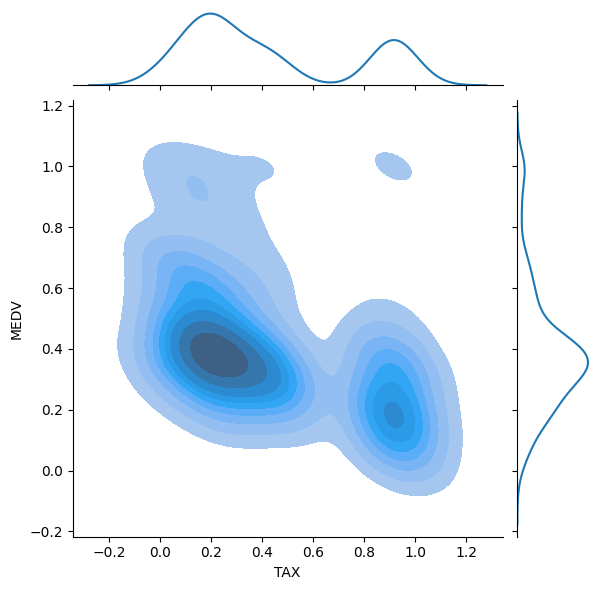

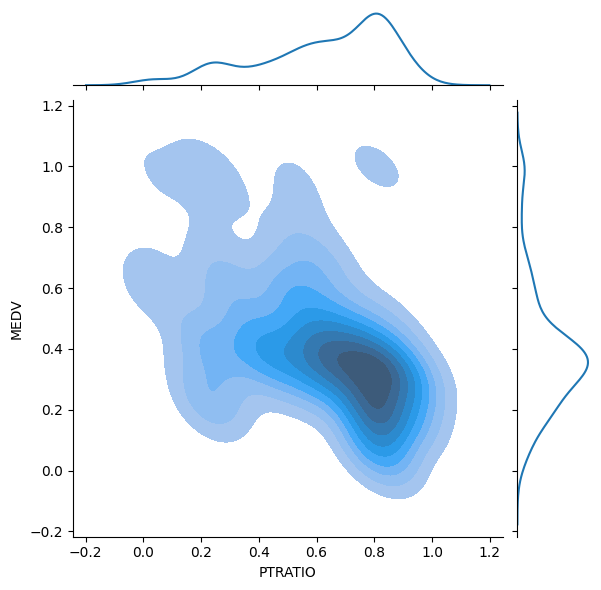

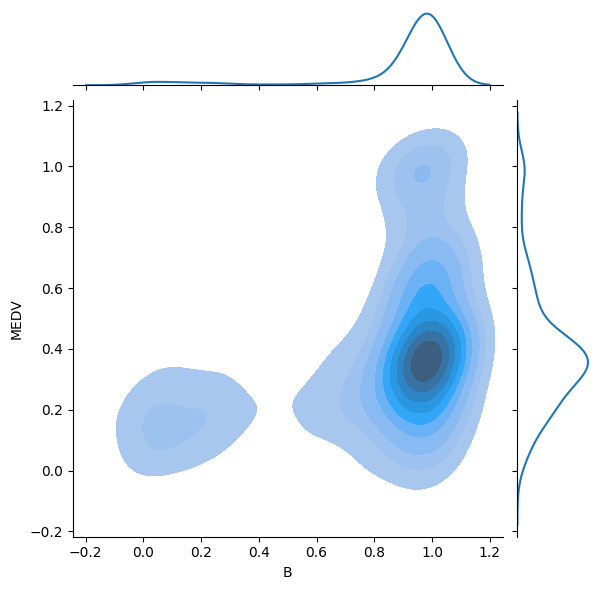

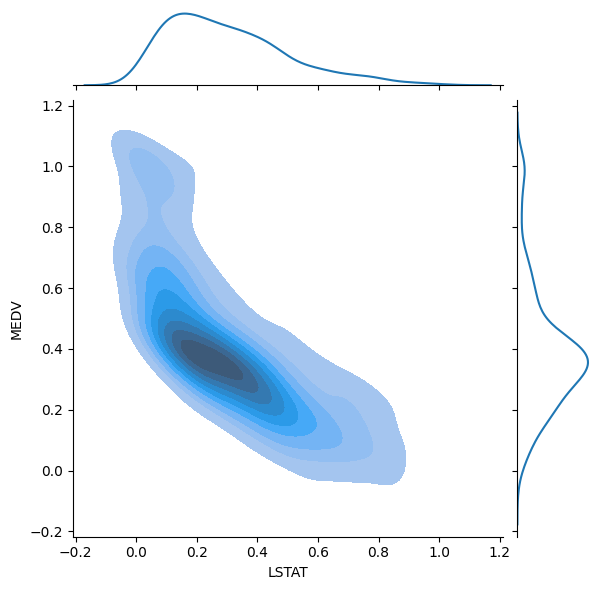

In [15]:
for i in df.columns:
    if i == 'MEDV':
        continue
    sns.jointplot(x =i, y ='MEDV', data = df,kind='kde', shade = True)

<AxesSubplot: >

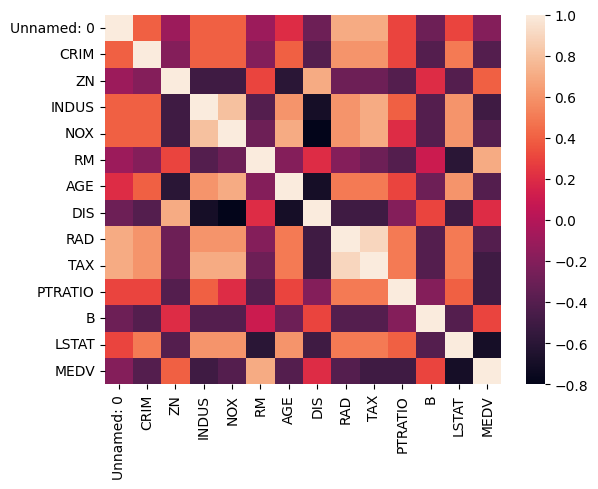

In [16]:
corr_matrix = df.corr().round(1)
sns.heatmap(data=corr_matrix)

In [17]:
df.corr()

,Unnamed: 0,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
Unnamed: 0,1.000000,0.407407,-0.103393,0.399439,0.398736,-0.079971,0.203784,-0.302211,0.686002,0.666626,0.291074,-0.295041,0.258465,-0.226604
CRIM,0.407407,1.000000,-0.200469,0.406583,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.103393,-0.200469,1.000000,-0.533828,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.399439,0.406583,-0.533828,1.000000,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
NOX,0.398736,0.420972,-0.516604,0.763651,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.079971,-0.219247,0.311991,-0.391676,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.203784,0.352734,-0.569537,0.644779,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.302211,-0.379670,0.664408,-0.708027,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.686002,0.625505,-0.311948,0.595129,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.666626,0.582764,-0.314563,0.720760,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


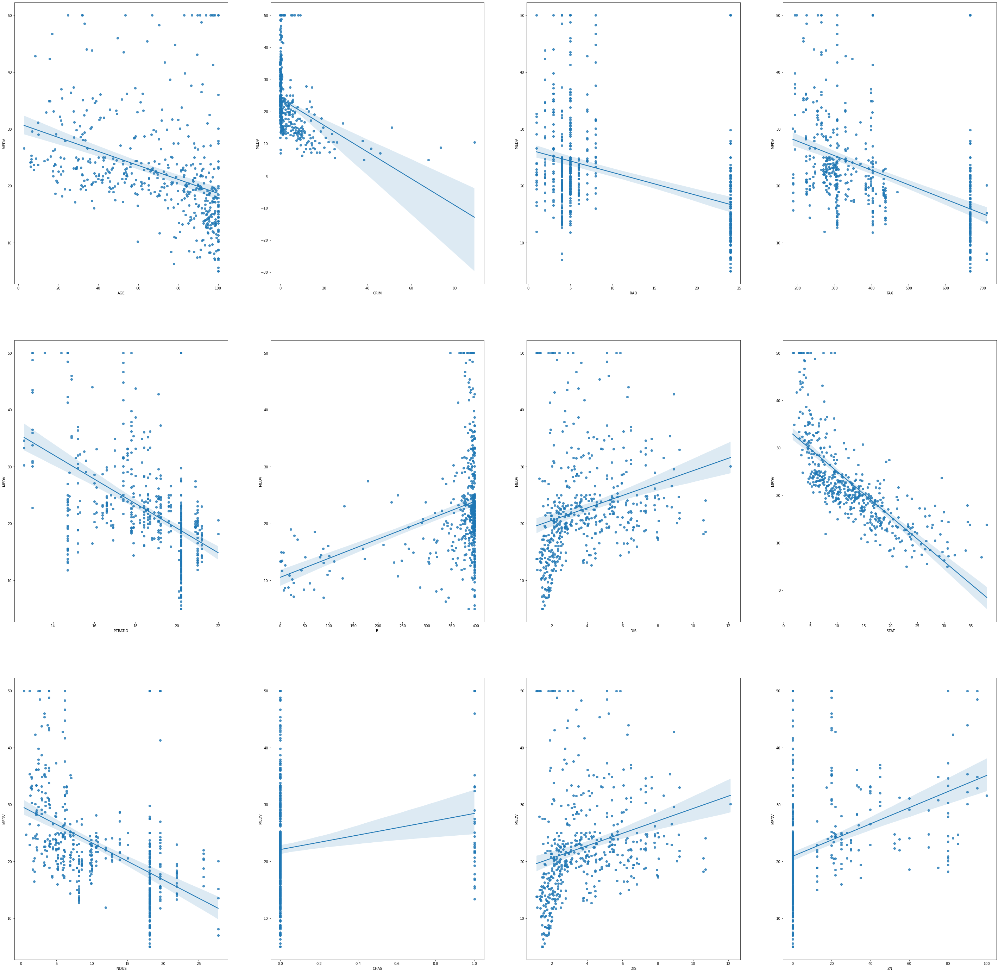

In [ ]:
plt.figure(figsize = (50,50))
plt.subplot(3,4,1)
sns.regplot(x=df['AGE'],y=df['MEDV'],data=df)
plt.subplot(3,4,2)
sns.regplot(x=df['CRIM'],y=df['MEDV'],data=df)
plt.subplot(3,4,3)
sns.regplot(x=df['RAD'],y=df['MEDV'],data=df)
plt.subplot(3,4,4)
sns.regplot(x=df['TAX'],y=df['MEDV'],data=df)
plt.subplot(3,4,5)
sns.regplot(x=df['PTRATIO'],y=df['MEDV'],data=df)
plt.subplot(3,4,6)
sns.regplot(x=df['B'],y=df['MEDV'],data=df)
plt.subplot(3,4,7)
sns.regplot(x=df['DIS'],y=df['MEDV'],data=df)
plt.subplot(3,4,8)
sns.regplot(x=df['LSTAT'],y=df['MEDV'],data=df)
plt.subplot(3,4,9)
sns.regplot(x=df['INDUS'],y=df['MEDV'],data=df)
plt.subplot(3,4,10)
sns.regplot(x=df['CHAS'],y=df['MEDV'],data=df)
plt.subplot(3,4,11)
sns.regplot(x=df['DIS'],y=df['MEDV'],data=df)
plt.subplot(3,4,12)
sns.regplot(x=df['ZN'],y=df['MEDV'],data=df)

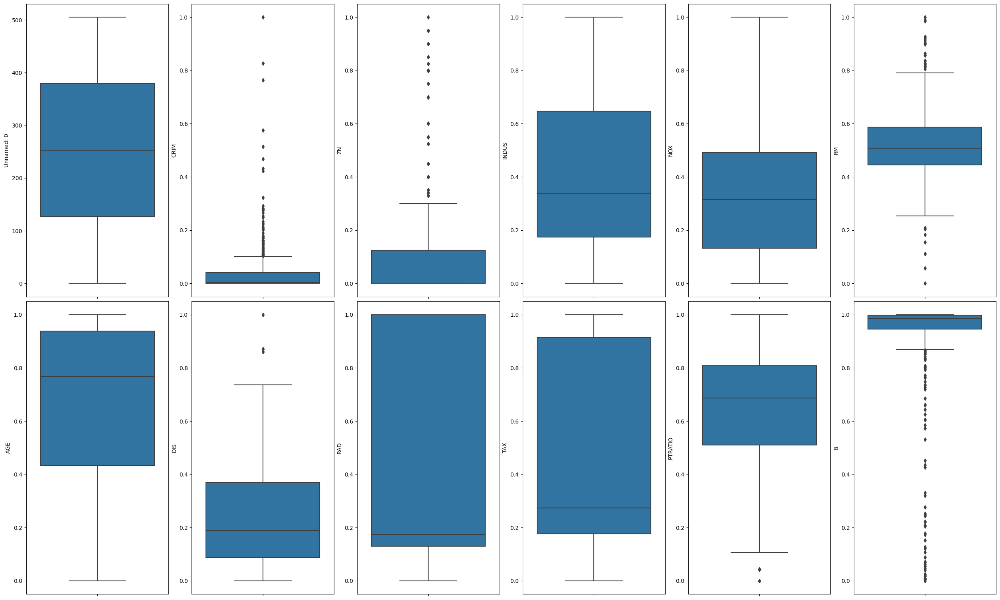

In [20]:
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(25, 15))
ax = ax.flatten()
index = 0
for i in df.columns:
  if (index >=12):
    break
  sns.boxplot(y=i, data=df, ax=ax[index])
  index +=1
plt.tight_layout(pad=0.5)
plt.show()

In [21]:
corr_matrix

,Unnamed: 0,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
Unnamed: 0,1.0,0.4,-0.1,0.4,0.4,-0.1,0.2,-0.3,0.7,0.7,0.3,-0.3,0.3,-0.2
CRIM,0.4,1.0,-0.2,0.4,0.4,-0.2,0.4,-0.4,0.6,0.6,0.3,-0.4,0.5,-0.4
ZN,-0.1,-0.2,1.0,-0.5,-0.5,0.3,-0.6,0.7,-0.3,-0.3,-0.4,0.2,-0.4,0.4
INDUS,0.4,0.4,-0.5,1.0,0.8,-0.4,0.6,-0.7,0.6,0.7,0.4,-0.4,0.6,-0.5
NOX,0.4,0.4,-0.5,0.8,1.0,-0.3,0.7,-0.8,0.6,0.7,0.2,-0.4,0.6,-0.4
RM,-0.1,-0.2,0.3,-0.4,-0.3,1.0,-0.2,0.2,-0.2,-0.3,-0.4,0.1,-0.6,0.7
AGE,0.2,0.4,-0.6,0.6,0.7,-0.2,1.0,-0.7,0.5,0.5,0.3,-0.3,0.6,-0.4
DIS,-0.3,-0.4,0.7,-0.7,-0.8,0.2,-0.7,1.0,-0.5,-0.5,-0.2,0.3,-0.5,0.2
RAD,0.7,0.6,-0.3,0.6,0.6,-0.2,0.5,-0.5,1.0,0.9,0.5,-0.4,0.5,-0.4
TAX,0.7,0.6,-0.3,0.7,0.7,-0.3,0.5,-0.5,0.9,1.0,0.5,-0.4,0.5,-0.5


Preprocessing

Correlation analysis

####1. The feature 'RM' has a strong positive correlation with the target variable 'MEDV' as the value of 'RM' increases, the value of 'MEDV' also increases. This indicates a positive linear relationship between these two variables. The correlation coefficient between 'RM' and 'MEDV' is 0.7 which is the highest among all features.

####2. The feature 'LSTAT' has a high negative correlation with 'MEDV' as the value of 'LSTAT' increases, the value of 'MEDV' decreases. This indicates a negative linear relationship between these two variables. The correlation coefficient between 'LSTAT' and 'MEDV' is -0.7 which is the second highest among all features.

####3. The feature 'CRIM' has the least correlation value with 'MEDV'.

# Preprocessing and Feature Engineering

In [22]:
print(df.T[df.T.duplicated(keep=False)].T.count())

Series([], dtype: int64)


In [23]:
df[df.duplicated(keep=False)].count()

Unnamed: 0    0
CRIM          0
ZN            0
INDUS         0
NOX           0
RM            0
AGE           0
DIS           0
RAD           0
TAX           0
PTRATIO       0
B             0
LSTAT         0
MEDV          0
dtype: int64

In [24]:
import numpy as np
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values = np.nan,
                        strategy ='mean')
imputer = imputer.fit(df)
imputed = imputer.transform(df)
df = pd.DataFrame(imputed,columns = df.columns)

In [25]:
min= 100
for i in df.columns:
    corr = df[i].corr(df['MEDV'],method='pearson')
    if(min>abs(corr)):
      min=abs(corr)
      x=i

print(min,x)
df = df.drop(x,axis=1)
df

0.22660364293534008 Unnamed: 0


,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.000000,0.18,0.067815,0.314815,0.577505,0.641607,0.269203,0.000000,0.208015,0.287234,1.000000,0.089680,0.422222
1,0.000236,0.00,0.242302,0.172840,0.547998,0.782698,0.348962,0.043478,0.104962,0.553191,1.000000,0.204470,0.368889
2,0.000236,0.00,0.242302,0.172840,0.694386,0.599382,0.348962,0.043478,0.104962,0.553191,0.989737,0.063466,0.660000
3,0.000293,0.00,0.063050,0.150206,0.658555,0.441813,0.448545,0.086957,0.066794,0.648936,0.994276,0.033389,0.631111
4,0.000705,0.00,0.063050,0.150206,0.687105,0.528321,0.448545,0.086957,0.066794,0.648936,1.000000,0.099338,0.693333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.000633,0.00,0.420455,0.386831,0.580954,0.681771,0.122671,0.000000,0.164122,0.893617,0.987619,0.219095,0.386667
502,0.000438,0.00,0.420455,0.386831,0.490324,0.760041,0.105293,0.000000,0.164122,0.893617,1.000000,0.202815,0.346667
503,0.000612,0.00,0.420455,0.386831,0.654340,0.907312,0.094381,0.000000,0.164122,0.893617,1.000000,0.107892,0.420000
504,0.001161,0.00,0.420455,0.386831,0.619467,0.889804,0.114514,0.000000,0.164122,0.893617,0.991301,0.131071,0.377778


In [26]:

scaler = MinMaxScaler(feature_range=(0, 1))
rescaled = scaler.fit_transform(df)


In [27]:
df = pd.DataFrame(rescaled,columns=df.columns)


In [28]:
for i in df.columns:
  df.sort_values(by=i, ascending=True, na_position='last')
  q1, q3 = np.nanpercentile(df[i], [25,75])
  iqr = q3-q1
  lower_bound = q1-(1.5*iqr)
  upper_bound = q3+(1.5*iqr)
  outlier_data = df[i][(df[i] < lower_bound) | (df[i] > upper_bound)] #creating a series of outlier data
  perc = (outlier_data.count()/df[i].count())*100
  print('Outliers in %s is %.2f%% with count %.f' %(i, perc, outlier_data.count()))

Outliers in CRIM is 13.04% with count 66
Outliers in ZN is 13.44% with count 68
Outliers in INDUS is 0.00% with count 0
Outliers in NOX is 0.00% with count 0
Outliers in RM is 5.93% with count 30
Outliers in AGE is 0.00% with count 0
Outliers in DIS is 0.99% with count 5
Outliers in RAD is 0.00% with count 0
Outliers in TAX is 0.00% with count 0
Outliers in PTRATIO is 2.96% with count 15
Outliers in B is 15.22% with count 77
Outliers in LSTAT is 1.38% with count 7
Outliers in MEDV is 7.91% with count 40


In [29]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)
'''Removing Outliers'''
#df = df[~((df < (Q1 - 1.5 * IQR)) |(df> (Q3 + 1.5 * IQR))).any(axis=1)]
df.shape

CRIM       0.040407
ZN         0.125000
INDUS      0.473240
NOX        0.360082
RM         0.141406
AGE        0.505149
DIS        0.280829
RAD        0.869565
TAX        0.738550
PTRATIO    0.297872
B          0.052568
LSTAT      0.276076
MEDV       0.177222
dtype: float64


(506, 13)

Model Training and testing


In [30]:
X = df[['CRIM','ZN','INDUS','NOX','RM','AGE','DIS','RAD','TAX','PTRATIO','B','LSTAT']]
y = df['MEDV']

In [31]:
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=5,train_size=0.8)

In [32]:
print(len(X_train),len(X_test))

404 102


# Review-1 Models

In [33]:
linearModel = LinearRegression()
supportVectorRegressor = SVR()
knnRegressor = KNeighborsRegressor(n_neighbors=3)

In [34]:
linearModel.fit(X_train,y_train)


LinearRegression()

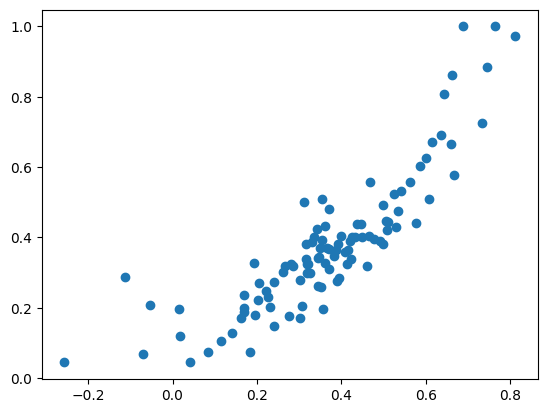

In [35]:
linearPred = linearModel.predict(X_test)
plt.scatter(linearPred,y_test)

In [36]:
knnRegressor.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=3)

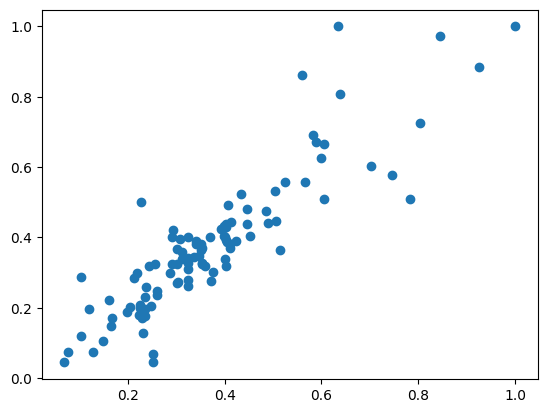

In [37]:
knnPred = knnRegressor.predict(X_test)
plt.scatter(knnPred,y_test)

In [38]:
arr = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
gsmodel = GridSearchCV(estimator=knnRegressor,
                      param_grid={'n_neighbors':arr},
                       cv = 5
                      )
gsmodel.fit(X_train,y_train)
gsPred = gsmodel.predict(X_test)


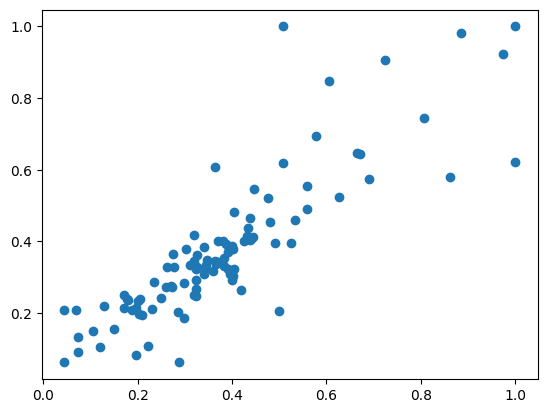

In [39]:
plt.scatter(y_test,gsPred)

In [40]:
gsRes = pd.DataFrame(gsmodel.cv_results_)
gsRes

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_neighbors,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.004809,0.000735,0.004595,0.000799,1,{'n_neighbors': 1},0.873165,0.796091,0.825222,0.684010,0.732288,0.782155,0.067009,4
1,0.005205,0.000757,0.005593,0.000486,2,{'n_neighbors': 2},0.897279,0.771243,0.896156,0.745474,0.855097,0.833050,0.063377,1
2,0.005585,0.000495,0.006001,0.000033,3,{'n_neighbors': 3},0.876222,0.767964,0.852679,0.757073,0.864667,0.823721,0.050640,2
3,0.005414,0.000475,0.005415,0.000490,4,{'n_neighbors': 4},0.804535,0.735860,0.841568,0.759968,0.854977,0.799382,0.045794,3
4,0.005798,0.000981,0.005219,0.000394,5,{'n_neighbors': 5},0.764352,0.714015,0.832038,0.724326,0.832983,0.773543,0.051000,5
5,0.004604,0.000495,0.005009,0.000014,6,{'n_neighbors': 6},0.714734,0.709695,0.824360,0.692732,0.816651,0.751634,0.056756,6
6,0.004187,0.000418,0.004995,0.000017,7,{'n_neighbors': 7},0.690849,0.713010,0.800289,0.663217,0.791027,0.731679,0.054648,7
7,0.005206,0.000379,0.005203,0.000382,8,{'n_neighbors': 8},0.646749,0.707861,0.788208,0.651301,0.766595,0.712143,0.057875,8
8,0.005791,0.000396,0.006610,0.001198,9,{'n_neighbors': 9},0.631501,0.697391,0.778768,0.647314,0.745629,0.700121,0.056144,9
9,0.005608,0.000794,0.005598,0.000491,10,{'n_neighbors': 10},0.612421,0.684158,0.764405,0.675985,0.732168,0.693827,0.051942,10


In [41]:
gsRes[['param_n_neighbors','rank_test_score']].sort_values(by = 'rank_test_score')

,param_n_neighbors,rank_test_score
1,2,1
2,3,2
3,4,3
0,1,4
4,5,5
5,6,6
6,7,7
7,8,8
8,9,9
9,10,10


In [42]:
#decision tree
decisionTreeRegressor = DecisionTreeRegressor()
decisionTreeRegressor.fit(X_train,y_train)

DecisionTreeRegressor()

In [43]:
DTpred = decisionTreeRegressor.predict(X_test)


In [ ]:
from sklearn.tree import export_text
tree_rules = export_text(decisionTreeRegressor, feature_names=list(X.columns))
print(tree_rules)

|--- RM <= 0.65
|   |--- LSTAT <= 0.35
|   |   |--- DIS <= 0.03
|   |   |   |--- value: [1.00]
|   |   |--- DIS >  0.03
|   |   |   |--- RM <= 0.57
|   |   |   |   |--- LSTAT <= 0.17
|   |   |   |   |   |--- DIS <= 0.30
|   |   |   |   |   |   |--- ZN <= 0.34
|   |   |   |   |   |   |   |--- RM <= 0.24
|   |   |   |   |   |   |   |   |--- value: [0.50]
|   |   |   |   |   |   |   |--- RM >  0.24
|   |   |   |   |   |   |   |   |--- LSTAT <= 0.11
|   |   |   |   |   |   |   |   |   |--- value: [0.49]
|   |   |   |   |   |   |   |   |--- LSTAT >  0.11
|   |   |   |   |   |   |   |   |   |--- RM <= 0.55
|   |   |   |   |   |   |   |   |   |   |--- ZN <= 0.10
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |   |--- ZN >  0.10
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- RM >  0.55
|   |   |   |   |   |   |   |   |   |   |--- value: [0.41]
|   |   |   |  

In [ ]:
#plotting the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=(400,350))
plot_tree(decisionTreeRegressor,feature_names=list(X.columns),filled=True,fontsize=10)
plt.show()


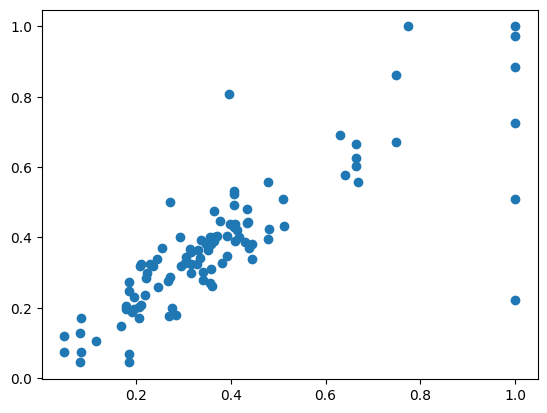

In [44]:
plt.scatter(DTpred, y_test)

In [45]:
#SVR
supportVectorRegressor = SVR()
supportVectorRegressor.fit(X_train,y_train)

SVR()

In [46]:
svrPred = supportVectorRegressor.predict(X_test)


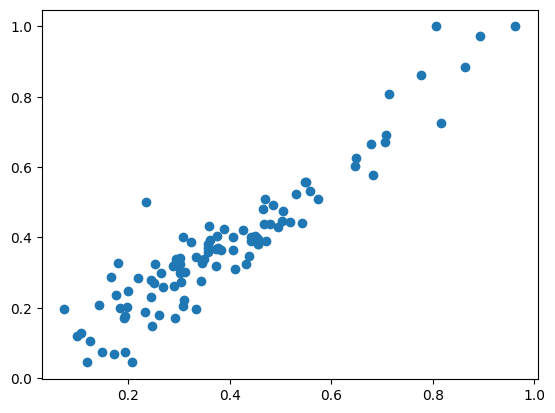

In [47]:
plt.scatter(svrPred,y_test)

In [48]:
print("METRICS FOR LINEAR REGRESSION")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, linearPred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, linearPred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, linearPred)))
print('R-squared error : ',r2_score(y_test, linearPred))

METRICS FOR LINEAR REGRESSION
Mean Absolute Error : 0.07238675490271247
Mean Squared Error: 0.010542276544568388
Root Mean Squared Error: 0.10267558884451741
R-squared error :  0.72733356575639


In [49]:
print("METRICS FOR KNN")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, gsPred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, gsPred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, gsPred)))
print('R-squared error : ',r2_score(y_test, gsPred))

METRICS FOR KNN
Mean Absolute Error : 0.06873638344226579
Mean Squared Error: 0.01110539820866619
Root Mean Squared Error: 0.10538215317911373
R-squared error :  0.7127689339573897


In [50]:
print("METRICS FOR DT")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, DTpred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, DTpred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, DTpred)))
print('R-squared error : ',r2_score(y_test, DTpred))


METRICS FOR DT
Mean Absolute Error : 0.0720479302832244
Mean Squared Error: 0.015508835633018643
Root Mean Squared Error: 0.1245344756805064
R-squared error :  0.5988780133543192


In [51]:
print("METRICS FOR SVR")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, svrPred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, svrPred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, svrPred)))
print('R-squared error : ',r2_score(y_test, svrPred))


METRICS FOR SVR
Mean Absolute Error : 0.053580385834219105
Mean Squared Error: 0.004890773719864015
Root Mean Squared Error: 0.06993406694783319
R-squared error :  0.8735045675144282


# Review - 2

-------------------------------------------------------------------------------------------------------------------------------------------------

In [52]:

# X = df[['CRIM','ZN','INDUS','NOX','RM','AGE','DIS','RAD','TAX','PTRATIO','B','LSTAT']]
# y = df['MEDV']
# X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=5,train_size=0.8)

In [53]:
df

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.000000,0.18,0.067815,0.314815,0.577505,0.641607,0.269203,0.000000,0.208015,0.287234,1.000000,0.089680,0.422222
1,0.000236,0.00,0.242302,0.172840,0.547998,0.782698,0.348962,0.043478,0.104962,0.553191,1.000000,0.204470,0.368889
2,0.000236,0.00,0.242302,0.172840,0.694386,0.599382,0.348962,0.043478,0.104962,0.553191,0.989737,0.063466,0.660000
3,0.000293,0.00,0.063050,0.150206,0.658555,0.441813,0.448545,0.086957,0.066794,0.648936,0.994276,0.033389,0.631111
4,0.000705,0.00,0.063050,0.150206,0.687105,0.528321,0.448545,0.086957,0.066794,0.648936,1.000000,0.099338,0.693333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.000633,0.00,0.420455,0.386831,0.580954,0.681771,0.122671,0.000000,0.164122,0.893617,0.987619,0.219095,0.386667
502,0.000438,0.00,0.420455,0.386831,0.490324,0.760041,0.105293,0.000000,0.164122,0.893617,1.000000,0.202815,0.346667
503,0.000612,0.00,0.420455,0.386831,0.654340,0.907312,0.094381,0.000000,0.164122,0.893617,1.000000,0.107892,0.420000
504,0.001161,0.00,0.420455,0.386831,0.619467,0.889804,0.114514,0.000000,0.164122,0.893617,0.991301,0.131071,0.377778


# Lasso Regressor

In [54]:
from sklearn.linear_model import LassoCV
lasso_cv = LassoCV(alphas=[0.0001, 0.001, 0.01, 0.1,
                   1, 10], random_state=0).fit(X_train, y_train)
print(lasso_cv.alpha_)
print(lasso_cv.score(X_train, y_train))
print(lasso_cv.score(X_test, y_test))
lasso_pred = lasso_cv.predict(X_test)


0.0001
0.7330419267532451
0.7294496201903127


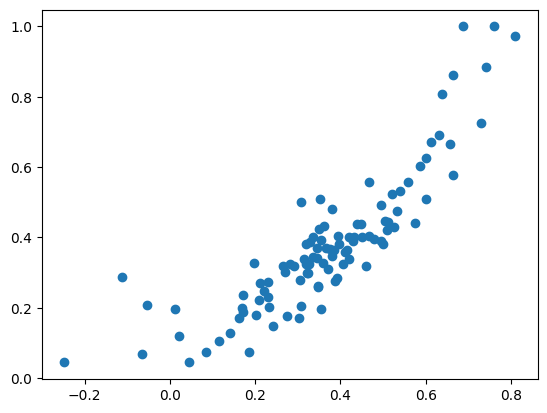

In [55]:
plt.scatter(lasso_pred,y_test)

# Ridge Regressor

In [56]:
from sklearn.linear_model import RidgeCV

ridge_cv = RidgeCV(alphas=[0.0001, 0.001, 0.01, 0.1,
                   1, 10]).fit(X_train, y_train)
print(ridge_cv.alpha_)
print(ridge_cv.score(X_train, y_train))
print(ridge_cv.score(X_test, y_test))
ridge_pred = ridge_cv.predict(X_test)



0.1
0.7332435007116604
0.7291128542399744


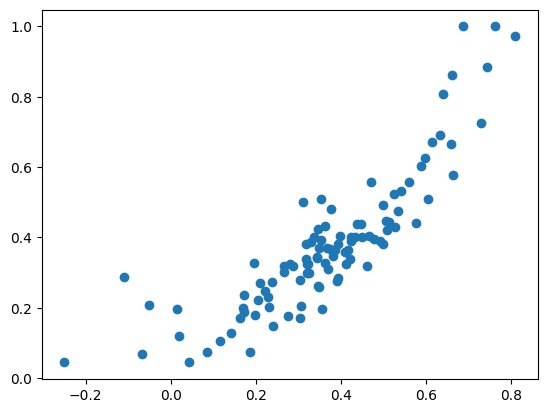

In [57]:
plt.scatter(ridge_pred, y_test)

# Kmeans Clustering

In [58]:
X = pd.DataFrame(df, columns = ['MEDV','RM'])

In [59]:
from sklearn.cluster import KMeans
wcss = [] 
for i in range(1, 11): 
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(X) 
    wcss.append(kmeans.inertia_)

C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warni

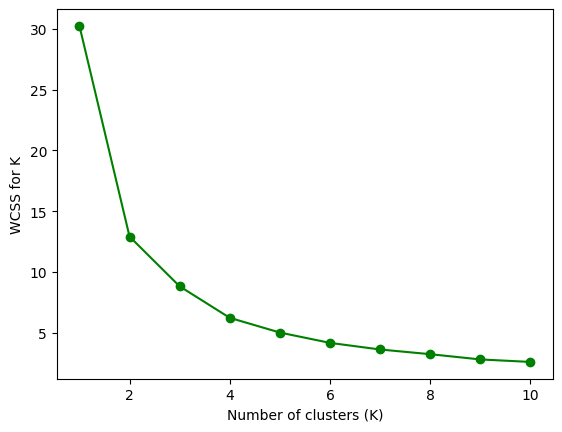

In [60]:

plt.plot(range(1, 11), wcss, color="green", marker="o")
plt.xlabel("Number of clusters (K)")
plt.ylabel("WCSS for K")
plt.show()

In [61]:
kmeans = KMeans(n_clusters= 2)
#predict the labels of clusters.
y_kmeans = kmeans.fit_predict(X)
y_kmeans

C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0,

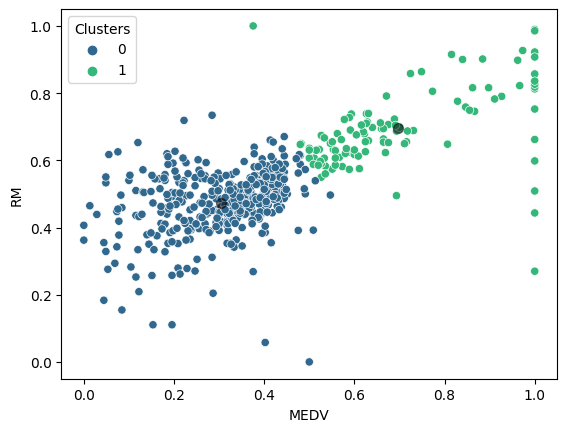

In [62]:
df['Clusters'] = kmeans.labels_
sns.scatterplot(x="MEDV", y="RM",hue = 'Clusters',  data=df,palette='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=50, alpha=0.5);

In [63]:
from sklearn.metrics import silhouette_score
score = silhouette_score(X,kmeans.labels_,metric='euclidean')
print('Silhuotte Score : %.2f' %score)

Silhuotte Score : 0.58


# Agglomerative Clustering

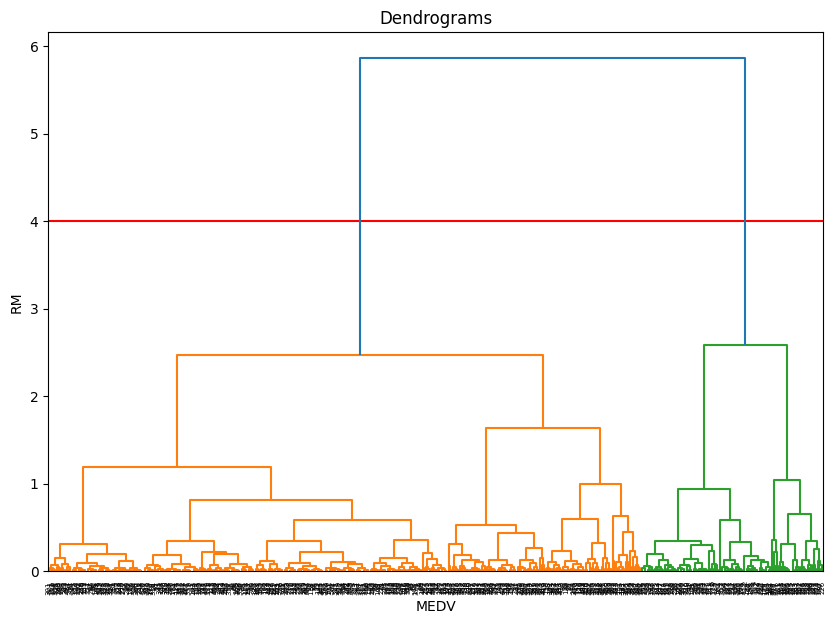

In [64]:
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(10, 7))
plt.title("Dendrograms")
plt.xlabel('MEDV')
plt.ylabel('RM')
plt.axhline(y=4,color='r',linestyle='-')
dend = sch.dendrogram(sch.linkage(X, method='ward'))
plt.show()


In [65]:
from sklearn.cluster import AgglomerativeClustering
ac = AgglomerativeClustering(n_clusters =2,affinity ='euclidean',linkage='ward')
y_ac = ac.fit_predict(X)
y_ac

C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1,

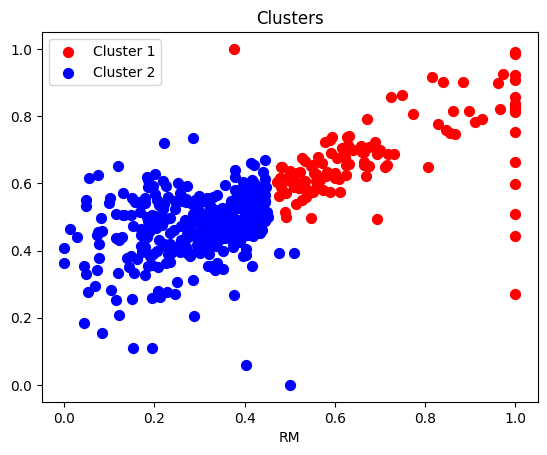

In [66]:
y = X.values
plt.scatter(y[y_ac==0,0],y[y_ac ==0,1],s=50,c='r',label='Cluster 1')
plt.scatter(y[y_ac==1,0],y[y_ac ==1,1],s=50,c='b',label='Cluster 2')
#plt.scatter(y[y_ac==2,0],y[y_ac ==2,1],s=50,c='g',label='Cluster 3')
plt.title('Clusters')
plt.xlabel('MEDV')
plt.xlabel('RM')
plt.legend()
plt.show()

In [67]:
score1 = silhouette_score(X,ac.fit_predict(X))
print('Silhouette score : %.3f'%score1)

Silhouette score : 0.565


C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


# Naive Bayes

In [68]:
a = np.zeros(len(df['MEDV'].values))

In [69]:
len(df['MEDV'].values)

506

In [70]:
df['MEDV'].values

array([0.42222222, 0.36888889, 0.66      , 0.63111111, 0.69333333,
       0.52666667, 0.39777778, 0.49111111, 0.25555556, 0.30888889,
       0.22222222, 0.30888889, 0.37111111, 0.34222222, 0.29333333,
       0.33111111, 0.40222222, 0.27777778, 0.33777778, 0.29333333,
       0.19111111, 0.32444444, 0.22666667, 0.21111111, 0.23555556,
       0.19777778, 0.25777778, 0.21777778, 0.29777778, 0.35555556,
       0.17111111, 0.21111111, 0.18222222, 0.18      , 0.18888889,
       0.30888889, 0.33333333, 0.35555556, 0.43777778, 0.57333333,
       0.66444444, 0.48      , 0.45111111, 0.43777778, 0.36      ,
       0.31777778, 0.33333333, 0.25777778, 0.20888889, 0.32      ,
       0.32666667, 0.34444444, 0.44444444, 0.40888889, 0.30888889,
       0.67555556, 0.43777778, 0.59111111, 0.40666667, 0.32444444,
       0.30444444, 0.24444444, 0.38222222, 0.44444444, 0.62222222,
       0.41111111, 0.32      , 0.37777778, 0.27555556, 0.35333333,
       0.42666667, 0.37111111, 0.39555556, 0.40888889, 0.42444

In [71]:
k=0
for i in df['MEDV'].values:
  if i < 0.25:
    a[k]=1
    k+=1
  elif 0.25<= i <=0.5:
    a[k]=2
    k+=1
  elif 0.5< i <=0.75:
    a[k]=3
    k+=1
  elif 0.75 < i <=1.0:
    a[k]=4
    k+=1 
 


In [72]:
df['Class'] =a

In [73]:
xc = df.drop(['Class','Clusters','MEDV'],axis=1)
yc = df['Class']

In [74]:
Xc_train,Xc_test,yc_train,yc_test = train_test_split(xc,yc,random_state=15,test_size=0.2)

In [75]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import RepeatedStratifiedKFold
cv_method = RepeatedStratifiedKFold(n_splits=5,  n_repeats=3, random_state=999)
from sklearn.preprocessing import PowerTransformer
param_grid_nb = {
    'var_smoothing': np.logspace(0,-9, num=100)
}
gs_NB = GridSearchCV(estimator=GaussianNB(),param_grid=param_grid_nb, cv=cv_method,verbose=1,scoring='accuracy')
Data_transformed = PowerTransformer().fit_transform(Xc_test)
gs_NB.fit(Xc_train, yc_train);


Fitting 15 folds for each of 100 candidates, totalling 1500 fits


In [76]:
naive = gs_NB.predict(Xc_test)
naive

array([3., 3., 2., 2., 2., 1., 2., 1., 3., 2., 2., 2., 2., 1., 2., 1., 1.,
       1., 2., 2., 3., 2., 2., 2., 2., 2., 3., 1., 2., 3., 2., 1., 2., 2.,
       2., 1., 2., 2., 1., 2., 3., 3., 1., 3., 1., 2., 2., 2., 3., 1., 3.,
       1., 2., 1., 2., 3., 1., 1., 1., 2., 1., 2., 2., 2., 3., 2., 2., 2.,
       2., 1., 2., 3., 2., 1., 3., 3., 3., 2., 1., 1., 2., 1., 3., 3., 3.,
       1., 3., 2., 2., 2., 3., 3., 1., 2., 2., 2., 2., 3., 2., 1., 1., 1.])

In [77]:
print("METRICS FOR Gaussian Naive Bayes")
print('Mean Absolute Error :', metrics.mean_absolute_error(yc_test, naive))
print('Mean Squared Error:', metrics.mean_squared_error(yc_test, naive))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(yc_test, naive)))
print('R-squared error : ',r2_score(yc_test, naive))

METRICS FOR Gaussian Naive Bayes
Mean Absolute Error : 0.3235294117647059
Mean Squared Error: 0.3431372549019608
Root Mean Squared Error: 0.5857791861290061
R-squared error :  0.41666666666666663


# Bagging Regressor

In [83]:
#Bagging regressor
from sklearn.ensemble import BaggingRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
regr1 = BaggingRegressor(max_features= 12, random_state=1)
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(regr1, X, y, cv=cv, n_jobs=-1)
regr1.fit(X_train, y_train)

ValueError: 
All the 30 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_bagging.py", line 339, in fit
    return self._fit(X, y, self.max_samples, sample_weight=sample_weight)
  File "C:\Users\sanja\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_bagging.py", line 422, in _fit
    raise ValueError("max_features must be <= n_features")
ValueError: max_features must be <= n_features


In [82]:
baggingPred = regr1.predict(X_test)

NotFittedError: This BaggingRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


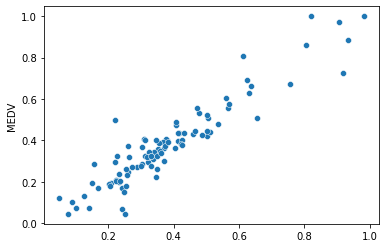

In [ ]:
sns.scatterplot(baggingPred,y_test)

In [ ]:
print("METRICS FOR Bagging Regressor")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, baggingPred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, baggingPred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, baggingPred)))
print('R-squared error : ',r2_score(y_test, baggingPred))

METRICS FOR Bagging Regressor
Mean Absolute Error : 0.04834204793028322
Mean Squared Error: 0.0049734422657952086
Root Mean Squared Error: 0.07052263654880757
R-squared error :  0.8713664204502842


# RandomForest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
regr2 = RandomForestRegressor(max_features= 12, random_state=1)
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(regr2, X, y, cv=cv, n_jobs=-1)
regr2.fit(X_train, y_train)

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
30 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_forest.py", line 450, in fit
    trees = Parallel(
  File "/usr/local/lib/python3.8/dist-packages/joblib/parallel.py", line 1085, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/lib/python3.8/dist-packages/joblib/parallel.py", l

RandomForestRegressor(max_features=12, random_state=1)

In [ ]:
RandomForestPred = regr2.predict(X_test)

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


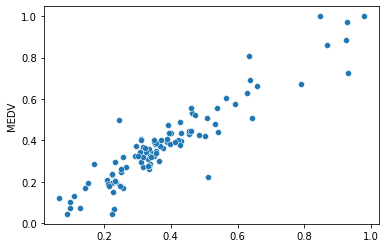

In [ ]:
sns.scatterplot(RandomForestPred,y_test)

In [ ]:
print("METRICS FOR Random Forest Regressor")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, RandomForestPred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, RandomForestPred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, RandomForestPred)))
print('R-squared error : ',r2_score(y_test, RandomForestPred))

METRICS FOR Random Forest Regressor
Mean Absolute Error : 0.04913769063180828
Mean Squared Error: 0.0051176600726216435
Root Mean Squared Error: 0.07153782267179819
R-squared error :  0.8676363575008297


# XG Boosting

METRICS FOR XGBOOST
Score Test: 0.30115812505115613
Mean Absolute Error : 0.11559869437955303
Mean Squared Error: 0.027019769877700096
Root Mean Squared Error: 0.1643769140655101
R-squared error :  0.30115812505115613


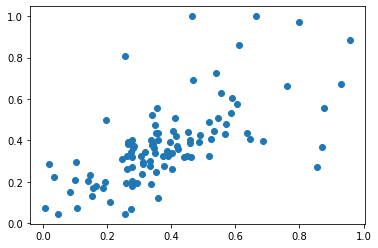

In [ ]:
import xgboost as xgb
xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=1, max_depth=10, alpha=1, n_estimators=2000)
xg_reg.fit(X_train,y_train)

xg_pred = xg_reg.predict(X_test)
xg_pred

plt.scatter(xg_pred,y_test)

print("METRICS FOR XGBOOST")
print("Score Test:", xg_reg.score(X_test, y_test))
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, xg_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, xg_pred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, xg_pred)))
print('R-squared error : ',r2_score(y_test, xg_pred))





# Gradient Boosting Regressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
GBmodel = GradientBoostingRegressor()
gsgbmodel = GridSearchCV(estimator=GBmodel,
                      param_grid={'n_estimators':[10,20,50,100,200,300,500,1000],
                                },
                       cv = 5
                      )
gsgbmodel.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'n_estimators': [10, 20, 50, 100, 200, 300, 500,
                                          1000]})

In [ ]:
GSGBmodel = pd.DataFrame(gsgbmodel.cv_results_)
GSGBmodel

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.014014,0.003090,0.002022,0.000087,10,{'n_estimators': 10},0.736275,0.738742,0.753986,0.701350,0.710246,0.728120,0.019414,8
1,0.023563,0.001574,0.002081,0.000245,20,{'n_estimators': 20},0.875954,0.855960,0.854902,0.827039,0.812621,0.845295,0.022569,7
2,0.053668,0.001654,0.002176,0.000200,50,{'n_estimators': 50},0.931189,0.894519,0.882641,0.885335,0.859846,0.890706,0.023236,6
3,0.107857,0.003254,0.002561,0.000497,100,{'n_estimators': 100},0.938524,0.896055,0.883773,0.895447,0.854178,0.893595,0.027123,5
4,0.216755,0.011437,0.002730,0.000084,200,{'n_estimators': 200},0.927729,0.905382,0.888761,0.904079,0.855658,0.896322,0.023830,4
5,0.313022,0.009045,0.002909,0.000048,300,{'n_estimators': 300},0.927738,0.905643,0.891892,0.904355,0.860663,0.898058,0.021975,1
6,0.530377,0.017763,0.003124,0.000117,500,{'n_estimators': 500},0.923552,0.909449,0.888791,0.907305,0.857027,0.897225,0.022939,2
7,1.040205,0.007721,0.004277,0.000756,1000,{'n_estimators': 1000},0.921405,0.908382,0.889830,0.905417,0.857088,0.896425,0.022085,3


In [ ]:
GSGBPred = gsgbmodel.best_estimator_.predict(X_test)
metrics.mean_squared_error(y_test,GSGBPred)

0.004523748095637273

In [ ]:
print("METRICS FOR Gradient Boosting Regressor")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, GSGBPred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, GSGBPred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, GSGBPred)))
print('R-squared error : ',r2_score(y_test, GSGBPred))

METRICS FOR Gradient Boosting Regressor
Mean Absolute Error : 0.04216494881387958
Mean Squared Error: 0.004523748095637273
Root Mean Squared Error: 0.06725881425982227
R-squared error :  0.8829973528545645


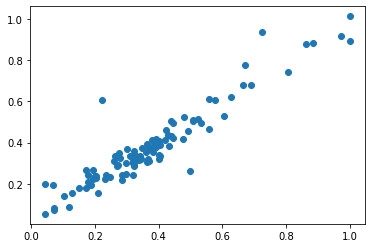

In [ ]:
plt.scatter(y_test,GSGBPred)

# Adaboosting Regressor

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
ABmodel = AdaBoostRegressor()
gsabmodel = GridSearchCV(estimator=ABmodel,
                      param_grid={'n_estimators':[10,20,50,100,200,300,500,1000],
                                },
                       cv = 5
                      )
gsabmodel.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=AdaBoostRegressor(),
             param_grid={'n_estimators': [10, 20, 50, 100, 200, 300, 500,
                                          1000]})

In [ ]:
GSABmodel = pd.DataFrame(gsabmodel.cv_results_)
GSABmodel

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.024278,0.002534,0.003150,0.000666,10,{'n_estimators': 10},0.840464,0.837709,0.820579,0.663391,0.840646,0.800558,0.068986,8
1,0.041260,0.003089,0.003625,0.000091,20,{'n_estimators': 20},0.883043,0.836194,0.837209,0.772284,0.795059,0.824758,0.038258,7
2,0.102976,0.011659,0.005967,0.000498,50,{'n_estimators': 50},0.911502,0.839972,0.857522,0.805026,0.826925,0.848189,0.035995,3
3,0.177726,0.004522,0.008322,0.000138,100,{'n_estimators': 100},0.919687,0.838500,0.845616,0.789082,0.844163,0.847409,0.041759,5
4,0.342887,0.008939,0.016100,0.001385,200,{'n_estimators': 200},0.903439,0.842142,0.859584,0.801789,0.832407,0.847872,0.033528,4
5,0.504409,0.023731,0.026325,0.005564,300,{'n_estimators': 300},0.893632,0.841310,0.868026,0.811400,0.829582,0.848790,0.028996,2
6,0.823783,0.009505,0.039748,0.005904,500,{'n_estimators': 500},0.894739,0.842256,0.866585,0.816558,0.825469,0.849121,0.028471,1
7,1.617096,0.012226,0.067414,0.001835,1000,{'n_estimators': 1000},0.892316,0.840517,0.862070,0.811653,0.822207,0.845753,0.028910,6


In [ ]:
GSABPred = gsabmodel.best_estimator_.predict(X_test)
metrics.mean_squared_error(y_test,GSABPred)

0.006044199195905371

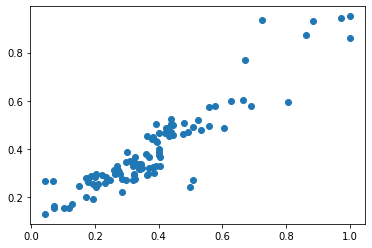

In [ ]:
plt.scatter(y_test,GSABPred)

In [ ]:
print("METRICS FOR Ada Boosting Regressor")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, GSABPred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, GSABPred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, GSABPred)))
print('R-squared error : ',r2_score(y_test, GSABPred))

METRICS FOR Ada Boosting Regressor
Mean Absolute Error : 0.05855494758339909
Mean Squared Error: 0.006044199195905371
Root Mean Squared Error: 0.07774444800695013
R-squared error :  0.8436722622824077


# Multi - Layer Perceptron

In [ ]:
from sklearn.neural_network import MLPRegressor
MLPModel = MLPRegressor(hidden_layer_sizes=5,activation='tanh',solver='sgd',learning_rate='adaptive')

In [ ]:
hidden_layer_sizes = [(50,20,10),(100,50,25),(20,10),(100,50),(200,100,50),(500,250,100)]
gsmlpmodel = GridSearchCV(estimator=MLPModel,
                      param_grid={
                        'hidden_layer_sizes': hidden_layer_sizes,
                                'activation':['relu','tanh'],
                                'max_iter':[2000],
                                'solver':['sgd','adam']
                                },
                       cv = 5
                      )
gsmlpmodel

GridSearchCV(cv=5,
             estimator=MLPRegressor(activation='tanh', hidden_layer_sizes=5,
                                    learning_rate='adaptive', solver='sgd'),
             param_grid={'activation': ['relu', 'tanh'],
                         'hidden_layer_sizes': [(50, 20, 10), (100, 50, 25),
                                                (20, 10), (100, 50),
                                                (200, 100, 50),
                                                (500, 250, 100)],
                         'max_iter': [2000], 'solver': ['sgd', 'adam']})

In [ ]:
gsmlpmodel.fit(X_train,y_train)
gsMLPPred = gsmlpmodel.predict(X_test)
gsMLPPred

array([0.81084249, 0.55879198, 0.44107794, 0.12190375, 0.5995128 ,
       0.10378851, 0.44709493, 0.48457589, 0.41074539, 0.36512058,
       0.60368463, 0.38593191, 0.36714134, 0.62071957, 0.45009957,
       0.32877188, 0.10516302, 0.26352909, 0.27824971, 0.27937105,
       0.19462702, 0.32906593, 0.82017828, 0.37549464, 0.52136438,
       0.12738531, 0.41616111, 0.35171081, 0.41668676, 0.35966102,
       0.32573654, 0.22457708, 0.25166439, 0.2620772 , 0.44599802,
       0.32104265, 0.4351205 , 0.13017222, 0.90367922, 0.68720215,
       0.30878131, 0.220712  , 0.50777243, 0.17493276, 0.45049044,
       0.47219588, 0.02599835, 0.35652442, 0.28833347, 0.27169749,
       0.33558511, 0.36183273, 0.38416174, 0.27363031, 0.24045886,
       0.3987801 , 0.73715414, 0.1844466 , 0.49051346, 0.3613279 ,
       0.32080826, 0.39983774, 0.28697783, 0.68048645, 0.35782318,
       0.17586953, 0.33186198, 0.43875395, 0.40179345, 0.40718912,
       0.26503337, 0.45313794, 0.33502058, 0.21258722, 0.42798

In [ ]:
MLPGSres = pd.DataFrame(gsmlpmodel.cv_results_)
MLPGSres

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_activation,param_hidden_layer_sizes,param_max_iter,param_solver,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.185977,0.042482,0.002224,0.000148,relu,"(50, 20, 10)",2000,sgd,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.100781,-0.081164,0.322054,-0.110428,-0.089516,0.028345,0.165320,23
1,0.141177,0.047910,0.002345,0.000088,relu,"(50, 20, 10)",2000,adam,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.637287,0.799934,0.803468,0.615327,0.790918,0.729387,0.084549,5
2,0.729706,0.274664,0.005014,0.001928,relu,"(100, 50, 25)",2000,sgd,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.205326,0.241647,0.478390,0.222264,0.244195,0.278364,0.101003,19
3,0.494747,0.223356,0.006532,0.003858,relu,"(100, 50, 25)",2000,adam,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.692462,0.774542,0.856315,0.791144,0.847181,0.792329,0.058982,3
4,0.144347,0.024704,0.002425,0.000164,relu,"(20, 10)",2000,sgd,"{'activation': 'relu', 'hidden_layer_sizes': (...",-0.043787,-0.074675,-0.235197,0.316502,0.062040,0.004977,0.182598,24
5,0.160034,0.108161,0.002494,0.000404,relu,"(20, 10)",2000,adam,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.142774,0.184589,0.799005,0.565148,0.774696,0.493243,0.281415,12
6,0.418573,0.050638,0.004370,0.002863,relu,"(100, 50)",2000,sgd,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.078836,0.392181,0.396300,0.399939,0.316709,0.316793,0.122916,17
7,0.206999,0.022342,0.002947,0.000107,relu,"(100, 50)",2000,adam,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.684352,0.798451,0.839879,0.654566,0.799237,0.755297,0.072287,4
8,1.026909,0.079582,0.003416,0.000072,relu,"(200, 100, 50)",2000,sgd,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.217548,0.319092,0.394112,0.139116,0.319659,0.277905,0.089274,20
9,0.597618,0.137518,0.003786,0.000372,relu,"(200, 100, 50)",2000,adam,"{'activation': 'relu', 'hidden_layer_sizes': (...",0.769666,0.879490,0.889500,0.794056,0.854131,0.837369,0.047397,2


In [ ]:

MLPpred = gsmlpmodel.best_estimator_.predict(X_test)


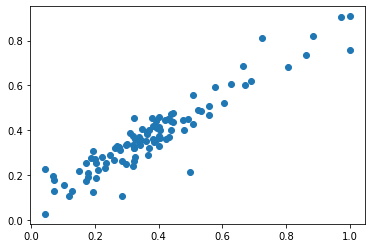

In [ ]:
plt.scatter(y_test,MLPpred)

In [ ]:
print("METRICS FOR MLPRegressor")
print('Mean Absolute Error :', metrics.mean_absolute_error(y_test, MLPpred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, MLPpred))
print('Root Mean Squared Error:', np.sqrt(
    metrics.mean_squared_error(y_test, MLPpred)))
print('R-squared error : ',r2_score(y_test, MLPpred))


METRICS FOR MLPRegressor
Mean Absolute Error : 0.05263414623797881
Mean Squared Error: 0.004956746711906251
Root Mean Squared Error: 0.07040416686465546
R-squared error :  0.8717982358297593


# Comparison Between Models

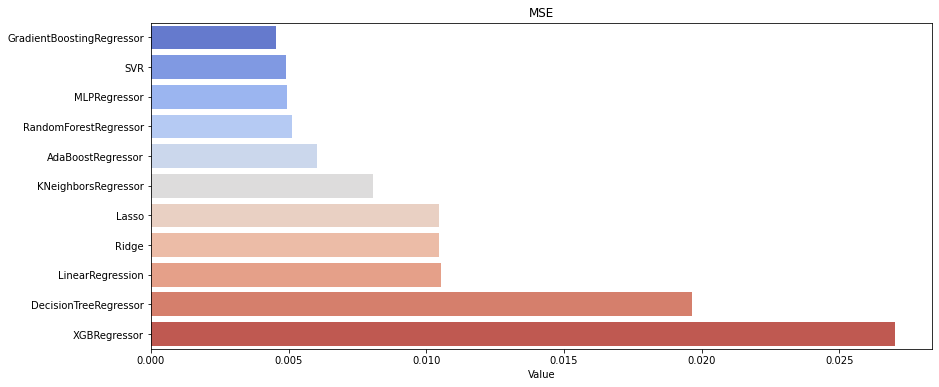

In [ ]:
mse = {
    "LinearRegression": [metrics.mean_squared_error(y_test, linearPred)],
    "MLPRegressor": [metrics.mean_squared_error(y_test, MLPpred)],
    "DecisionTreeRegressor": [metrics.mean_squared_error(y_test, DTpred)],
    "GradientBoostingRegressor": [metrics.mean_squared_error(y_test, GSGBPred)],
    "AdaBoostRegressor": [metrics.mean_squared_error(y_test, GSABPred)],
    "RandomForestRegressor": [metrics.mean_squared_error(y_test, RandomForestPred)],
    "XGBRegressor": [metrics.mean_squared_error(y_test, gspredxg)],
    "SVR": [metrics.mean_squared_error(y_test, svrPred)],
    "Lasso": [metrics.mean_squared_error(y_test, lasso_pred)],
    "Ridge": [metrics.mean_squared_error(y_test, ridge_pred)],
    "KNeighborsRegressor": [metrics.mean_squared_error(y_test, knnPred)]
    


}

mse = pd.DataFrame(mse).T
mse.columns = ["Value"]

plt.figure(figsize=(14, 6))
sns.barplot(y=mse.sort_values("Value").index, x="Value",
            palette="coolwarm", data=mse.sort_values("Value"))
plt.title("MSE")

plt.draw()

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score


def Reg_Models_Evaluation_Metrics(model, X_train, y_train, X_test, y_test, y_pred):
    cv_score = cross_val_score(estimator=model, X=X_train, y=y_train, cv=10)

    # Calculating Adjusted R-squared
    r2 = model.score(X_test, y_test)
    # Number of observations is the shape along axis 0
    n = X_test.shape[0]
    # Number of features (predictors, p) is the shape along axis 1
    p = X_test.shape[1]
    # Adjusted R-squared formula
    adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
    RMSE = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
    R2 = model.score(X_test, y_test)
    CV_R2 = cv_score.mean()

    return R2, adjusted_r2, CV_R2, RMSE

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    linearModel, X_train, y_train, X_test, y_test, linearPred)]
lm_score1 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score1.insert(0, 'Model', 'Linear')
lm_score1

,Model,R2 Score,Adjusted R2 Score,Cross Validated R2 Score,RMSE
0,Linear,0.727334,0.69057,0.699472,0.102676


In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    knnRegressor, X_train, y_train, X_test, y_test, knnPred)]
lm_score2 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score2.insert(0, 'Model', 'KNN')
lm_score2

,Model,R2 Score,Adjusted R2 Score,Cross Validated R2 Score,RMSE
0,KNN,0.791642,0.763548,0.841436,0.089755


In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    gsmodel, X_train, y_train, X_test, y_test, gsPred)]
lm_score3 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score3.insert(0, 'Model', 'Knn with Grid search')
lm_score3

,Model,R2 Score,Adjusted R2 Score,Cross Validated R2 Score,RMSE
0,Knn with Grid search,0.712769,0.674041,0.821659,0.105382


In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    decisionTreeRegressor, X_train, y_train, X_test, y_test, DTpred)]
lm_score4 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score4.insert(0, 'Model', 'DT')
lm_score4

,Model,R2 Score,Adjusted R2 Score,Cross Validated R2 Score,RMSE
0,DT,0.491435,0.422864,0.745088,0.140225


In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    supportVectorRegressor, X_train, y_train, X_test, y_test, svrPred)]
lm_score5 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score5.insert(0, 'Model', 'SVR')
lm_score5

,Model,R2 Score,Adjusted R2 Score,Cross Validated R2 Score,RMSE
0,SVR,0.873505,0.856449,0.83434,0.069934


In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    gsmlpmodel, X_train, y_train, X_test, y_test, MLPpred)]
lm_score6 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score6.insert(0, 'Model', 'MLP')
lm_score6

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    gsabmodel, X_train, y_train, X_test, y_test, GSABPred)]
lm_score7 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score7.insert(0, 'Model', 'Ada Boost')
lm_score7

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    gsgbmodel, X_train, y_train, X_test, y_test, GSGBPred)]
lm_score8 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score8.insert(0, 'Model', 'Gradient Boost')
lm_score8

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    regr1, X_train, y_train, X_test, y_test, baggingPred)]
lm_score9 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score9.insert(0, 'Model', 'Bagging')
lm_score9

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    regr2, X_train, y_train, X_test, y_test, RandomForestPred)]
lm_score10 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score10.insert(0, 'Model', 'Random Forest')
lm_score10

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    lasso_cv, X_train, y_train, X_test, y_test, lasso_pred)]
lm_score11 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score11.insert(0, 'Model', 'LASSO')
lm_score11

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    ridge_cv, X_train, y_train, X_test, y_test, ridge_pred)]
lm_score12 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score12.insert(0, 'Model', 'RIDGE')
lm_score12

In [ ]:
ndf = [Reg_Models_Evaluation_Metrics(
    xg_reg, X_train, y_train, X_test, y_test, gspredxg)]
lm_score13 = pd.DataFrame(data=ndf, columns=[
                         'R2 Score', 'Adjusted R2 Score', 'Cross Validated R2 Score', 'RMSE'])
lm_score13.insert(0, 'Model', 'XG Boost')
lm_score13

In [ ]:
predictions = pd.concat([lm_score1, lm_score2, lm_score3, lm_score4, lm_score5, lm_score6, lm_score7, lm_score8, lm_score9, lm_score10, lm_score11, lm_score12], ignore_index = True, sort = False)
predictions

In [ ]:
plt.bar(
    predictions['Model'],
    predictions['R2 Score'],
    color='blue',
)
plt.title('R2 Score')
plt.xlabel('Model')
plt.ylabel('R2 Score')
plt.show()

# Conclusion

Out of all the models that has been implemented Gradient Boosting has expressed <br> the greatest R2 value with a score of 0.88
